<a href="https://colab.research.google.com/github/armaletale/Band-Name-Generator/blob/master/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🐶 End-to-End Multi-class Dog Breed Classification

This noteboot builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

## 2.0 Data

The data we're using is from Kaggle's dog breed identification competition:

https://www.kaggle.com/competitions/dog-breed-identification/data

## 3.0 Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4.0 Features

Some information about the data:
* We're dealing with images (Unstructured data) so it's probably best we use deep learning/Transer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set ( these images have label)
* There are around 10,000+ images in the test set (there images have no label, because we want to predict them).

### Get Our workSpace ready

* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure we're using a GPU

In [ ]:
 # Import TensorFlow into Colab and necessary tools
 import tensorflow as tf
 import tensorflow_hub as hub
 print("TF version:", tf.__version__)
 print("TF Hub version:", hub.__version__)

 # Check for GPU availability
 print("GPU", "available (YESSS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.11.0
TF Hub version: 0.13.0
GPU available (YESSS!!!!)


## Getting  our data ready (turning it into tensors)

with all machine learning model, our data has to be in numerical format. so that's what we'll be doing first. Turning our images into Tensors (numerical representation).

Let's start by accessing our data and checking our labels.

In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/dog-breed-identification/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: >

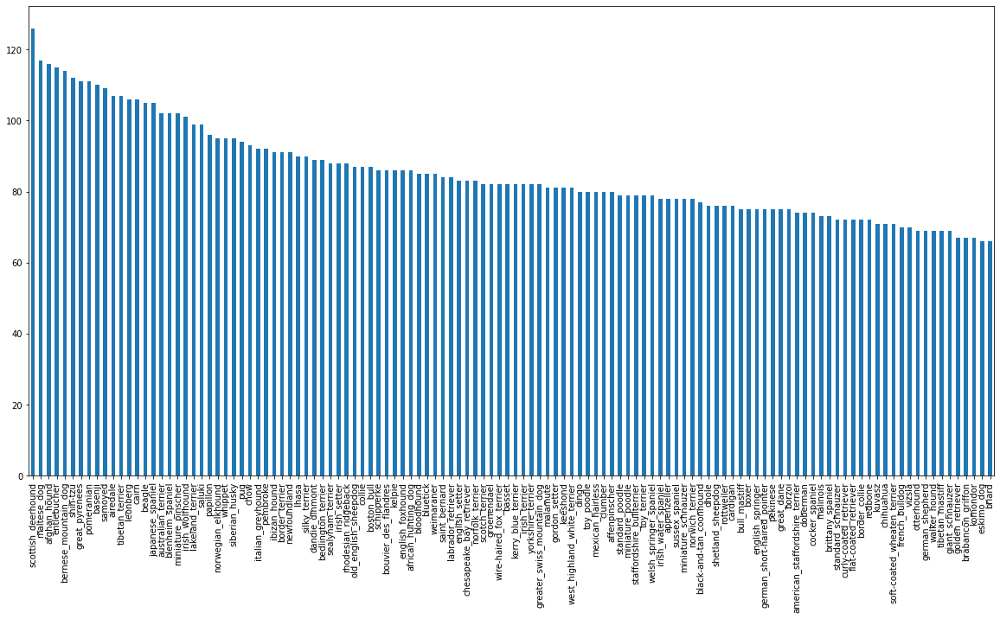

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

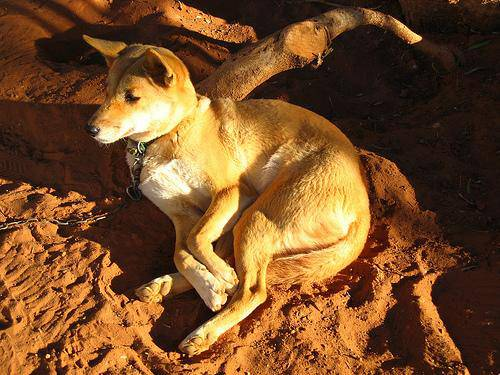

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### getting images and their label

Let's get a list of all of our image file pathnames

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image ID's
filenames = ["drive/MyDrive/Dog Vision/dog-breed-identification/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the irst 10
filenames[:10]

['drive/MyDrive/Dog Vision/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches the number o acutual image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/dog-breed-identification/train/")) == len(filenames):
  print("Filename match actual amount of files::: proceed.")
else:
  print("Filenames do no match actual amount of files, check the target directory.")

Filename match actual amount of files::: proceed.


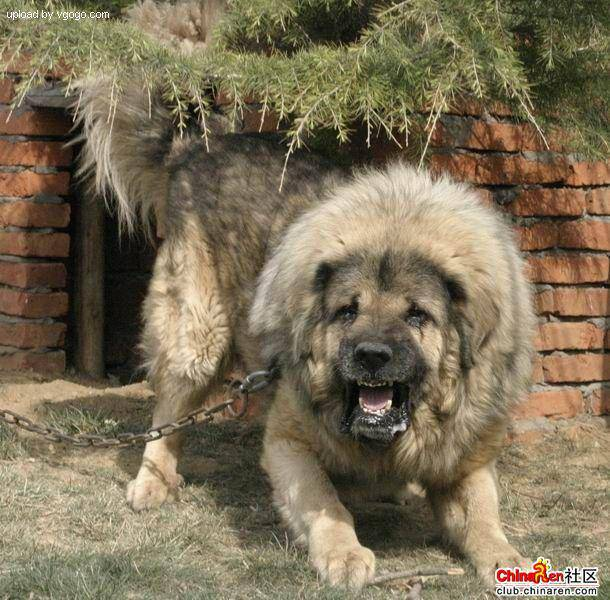

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list, let's pepare our labels.

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) # does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# Check i numbe o labes matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labes matches number of filenames:")
else:
  print("Number of labels does not match number of filenames, check data directories")

Number of labes matches number of filenames:


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example turning boolean array into integers
print(labels[0]) #Original label
print(np.where(unique_breeds == labels[0])) #index where label occurs
print(boolean_labels[0].argmax()) #index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
filenames[:10]

['drive/MyDrive/Dog Vision/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set

Since the dataset from kaggle doesn't come with a validation set, we're going to create our own

In [ ]:
# Setup X and y variables
X = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222

In [ ]:
len(boolean_labels)

10222

We're going to start with -1000 images and increase as needed.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Lets split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
# Let's have a geez at the training data
X_train[:5], y_train[:5]

(['drive/MyDrive/Dog Vision/dog-breed-identification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/dog-breed-identification/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/dog-breed-identification/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/dog-breed-identification/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/dog-breed-identification/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
     

## Reprocessing Images (turning images into Tensor)

To preprocess our images into Tensors we're going to write a function which does a ew things:
1. Take an image filepath as input
2. Use TensorFlow to read the ile and save it to a variable, `image`
3. Turn our `image` (a jpg) into tensors
4. Resize the `image` to be a shape of (224, 224)
5. Return the modified image

Before we do let's see what importing an image looks like.

In [ ]:
# convert an image to a Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  53],
        [ 97,  88,  49],
        [120, 111,  72]]

In [ ]:
# Turn image into tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  5

Now we've seen what an image looks like as a tensor lets make a function to preprocess them.

1. Take an image filepath as input
2. Use TensorFlow to read the ile and save it to a variable, image
3. Turn our image (a jpg) into tensors
4. Normalize our image (convert color channel value from 0-255 to 0-1). 
5. Resize the image to be a shape of (224, 224)
6. Return the modified image

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing image
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the JPG image into numerical tensor with 3 colour channels (RED, GREEN, BLUE)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel value from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


## Turning our data into batches

Why turn our data into batches?

Lets say you're trying to process 10,000+ images in one go... they might not it into memory.

so that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if need be).

In other to use tensorflow effectively, we need our data in the form of Tensor tuple which looks like this:
`(image, label)`

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label (image_path, label):
  """
  Takes an image file path name and the associated label, processes the image and return a type of (image, label).
  """

  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, lets make a function to turn all of our data (`X` & `y`) into batches!

In [ ]:
from tensorflow.python.data.ops.from_tensor_slices_op import from_tensor_slices
from numpy.matrixlib import test
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches (X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle i it's a validation data.
  Also accepts test data as input (No labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (No labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # if the data is a valid dataset, we don't need to shufle it
  elif valid_data:
    print("Creating validation data batch...")
    data =tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepath
                                             tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    #Turn filepath and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))
    
    # Create (image, label) tuples (this also turs the image path into processed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

    return data_batch



In [ ]:
# Create training and validation data batches
train_data =create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batch...


In [ ]:
# Check the different attributes o our data batches
train_data.element_spec, val_data.element_spec 

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however this can be a little hard to understand/ comprehend, let's visualize them

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Display a plot o 25 images and their labels from a data batch.

  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots(5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [ ]:
train_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

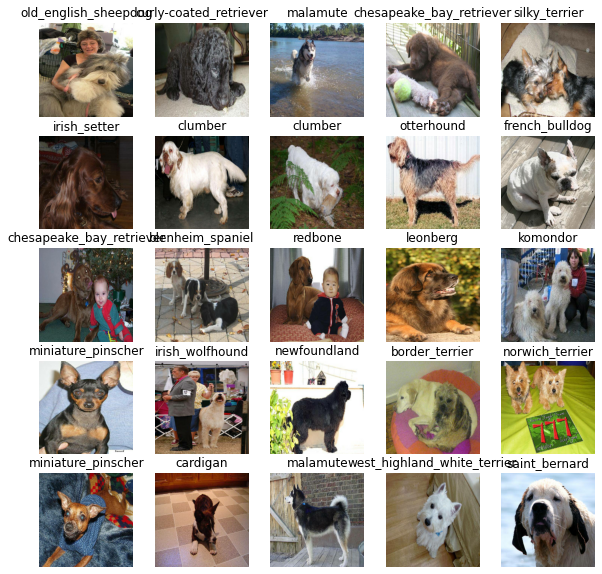

In [ ]:
# Now lets visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

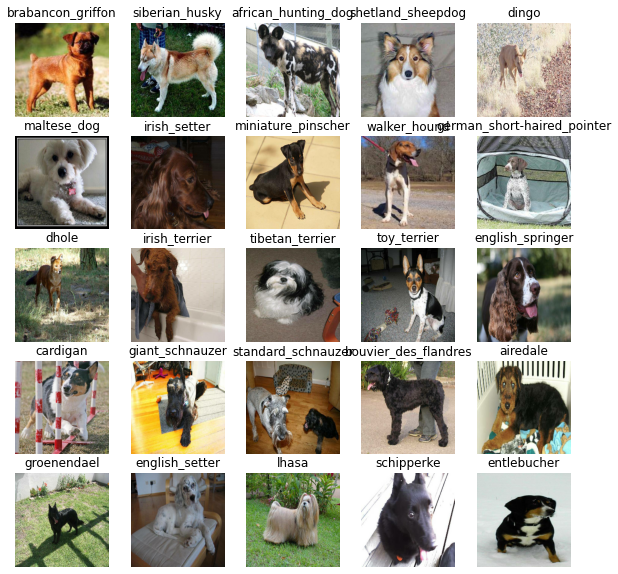

In [ ]:
# Now let's visualize our validation set
val_images, val_labels = next(train_data.as_numpy_iterator())
show_25_images(val_images, val_labels )

# Building a model

Before we build a model, there are a few things we need to define
* The input  shape (Our image shape, in the form of Tensors) to our model.
* The output shape (image labels, in the orm of Tensors) of our model.
* The URL of the model we want to use. From tensorflow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [ ]:
# Setup input shape to te model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL rom TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we've got our input , outputs and model ready to go. Let's put them together into a keras deep learning model.

Knowing this let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a keras model in sequential fashion (i.e do this irst then this, then that)
* Compiles the model (says how it should be evaluated and improved).
* Builds the model (tell the modelthe input shape it'll be getting).
* Returns the model.

All of this steps can be found here - https://www.tensorflow.org/guide/keras/sequential_model

In [ ]:
# Create a function which builds a keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with", MODEL_URL)

  # Setup model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
    loss=tf.keras.losses.CategoricalCrossentropy(),
    optimizer=tf.keras.optimizers.Adam(),
    metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_4 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_4 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


 ## Creating callbacks

 callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

 We'll create 2 callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training too long.

 ### TensorBoard callback

 To setup a tensorboard callback we need to do 3 things
 1. Load the TensorBoard notebook extension
 2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model `fit()` function.
 3. Visualize our models training logs with the  `%tensorboard` magic function (we'll do this ater model training). 

In [ ]:
# Load Tensorboard setback extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
import datetime

# create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # create a log directory for storing TensorBoard log 
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                        # Make it so the logs gets tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping callback
Early stopping helps stop our model rom overfitting by stopping training i a certain evaluation metric stops improving

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training our model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure we're still running on a GPU 
print("GPU", "available (YESSSS!!!!!!)" if tf.config.list_physical_devices("GPU") else "Not available")

GPU available (YESSSS!!!!!!)


Let's create a function which trains a model.

* Create a model using `create_model`
* Setup a TensorBoard callback using `create_tensorboard_callback`
* Call the fit `fit()` function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callback we'd like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Train a given model and return the trained version
  """
  # Create a model
  model = create_model()

  # Create a new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callback we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 17s 470ms/step - loss: 4.6562 - accuracy: 0.1025 - val_loss: 3.2594 - val_accuracy: 0.3050
Epoch 2/100
25/25 [==============================] - 3s 117ms/step - loss: 1.6389 - accuracy: 0.6888 - val_loss: 2.0589 - val_accuracy: 0.4900
Epoch 3/100
25/25 [==============================] - 3s 119ms/step - loss: 0.5731 - accuracy: 0.9275 - val_loss: 1.6012 - val_accuracy: 0.5850
Epoch 4/100
25/25 [==============================] - 5s 188ms/step - loss: 0.2539 - accuracy: 0.9875 - val_loss: 1.4074 - val_accuracy: 0.6350
Epoch 5/100
25/25 [==============================] - 4s 158ms/step - loss: 0.1494 - accuracy: 0.9950 - val_loss: 1.3393 - val_accuracy: 0.6300
Epoch 6/100
25/25 [==============================] - 4s 151ms/step - loss: 0.1016 - accuracy: 1.0000 - val_loss: 1.2952 - val_accuracy: 0.6350
Epoch 7/100
25/25 [==============================

### Checcking the TensorBoard  logs

The TensorBoard magic unction (%tensorboard) will access the logs directory we created earlier and visualize its content

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

Reusing TensorBoard on port 6006 (pid 15384), started 2:17:59 ago. (Use '!kill 15384' to kill it.)

<IPython.core.display.Javascript object>

## Making and evaluating predictions using trained model

In [ ]:
# Make predictions on the validation data (not used to train on)

predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 6s 92ms/step


array([[6.64890511e-04, 1.36695671e-04, 2.18854446e-04, ...,
        4.95184679e-04, 5.15214879e-06, 1.50673359e-03],
       [1.84811151e-03, 1.19481666e-03, 6.93986611e-03, ...,
        2.51014251e-04, 1.74716732e-03, 2.01361094e-04],
       [1.71951649e-06, 1.05502768e-05, 9.80647428e-07, ...,
        5.35812724e-05, 5.12315237e-05, 7.16585855e-05],
       ...,
       [1.38635960e-06, 4.63831057e-05, 3.10462601e-05, ...,
        1.11634672e-05, 1.33146705e-05, 4.06239742e-05],
       [1.51731505e-03, 2.15610649e-04, 6.81769525e-05, ...,
        7.13360132e-05, 3.22901287e-05, 1.68832708e-02],
       [3.89038469e-04, 1.36703457e-05, 7.01861514e-04, ...,
        8.05136282e-03, 2.31391517e-03, 4.09872082e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
predictions[0]

array([6.64890511e-04, 1.36695671e-04, 2.18854446e-04, 1.15076209e-05,
       1.25842125e-04, 1.84163982e-05, 2.23123953e-02, 5.56639628e-04,
       3.09987896e-04, 3.96689720e-04, 4.04758939e-05, 1.05604646e-04,
       2.76687992e-04, 1.78693372e-05, 2.75419588e-04, 2.42772236e-04,
       5.88526018e-05, 1.53634310e-01, 3.26772824e-05, 8.82168024e-05,
       6.75866846e-04, 1.34215225e-04, 1.52875164e-05, 8.83793633e-04,
       1.49851685e-05, 5.98858787e-05, 3.02910328e-01, 5.94607627e-05,
       1.82121381e-04, 5.71012279e-05, 7.03192200e-05, 3.64159729e-04,
       5.22400624e-05, 1.67997587e-05, 6.32881056e-05, 2.82009970e-02,
       7.03915111e-06, 3.21832224e-04, 1.04698673e-04, 1.57065675e-04,
       3.99939425e-04, 2.10930903e-05, 2.30592254e-04, 1.56419410e-04,
       6.53996758e-05, 5.37455853e-05, 1.73801491e-05, 5.44593568e-05,
       3.57109267e-04, 1.85651690e-04, 5.55946754e-05, 1.84714707e-04,
       2.20708956e-04, 4.68430117e-05, 2.21497248e-05, 4.34795329e-05,
      

In [ ]:
# First prediction
index = 42
print(predictions[0])
print(f"Max Value (probability of prediction) : {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted Label:{unique_breeds[np.argmax(predictions[index])]}")

[6.64890511e-04 1.36695671e-04 2.18854446e-04 1.15076209e-05
 1.25842125e-04 1.84163982e-05 2.23123953e-02 5.56639628e-04
 3.09987896e-04 3.96689720e-04 4.04758939e-05 1.05604646e-04
 2.76687992e-04 1.78693372e-05 2.75419588e-04 2.42772236e-04
 5.88526018e-05 1.53634310e-01 3.26772824e-05 8.82168024e-05
 6.75866846e-04 1.34215225e-04 1.52875164e-05 8.83793633e-04
 1.49851685e-05 5.98858787e-05 3.02910328e-01 5.94607627e-05
 1.82121381e-04 5.71012279e-05 7.03192200e-05 3.64159729e-04
 5.22400624e-05 1.67997587e-05 6.32881056e-05 2.82009970e-02
 7.03915111e-06 3.21832224e-04 1.04698673e-04 1.57065675e-04
 3.99939425e-04 2.10930903e-05 2.30592254e-04 1.56419410e-04
 6.53996758e-05 5.37455853e-05 1.73801491e-05 5.44593568e-05
 3.57109267e-04 1.85651690e-04 5.55946754e-05 1.84714707e-04
 2.20708956e-04 4.68430117e-05 2.21497248e-05 4.34795329e-05
 8.88911833e-04 1.54739851e-03 3.21316067e-04 2.45881364e-01
 1.31973968e-04 2.28278495e-05 1.52788148e-03 1.36421459e-05
 1.69281790e-04 2.156636

Having the above funtionality is great but we want to be able to do it at scale.

 And it will be even better if we could see the image the prediction is being made on.

 **Note** Prediction probability are also know as  confidence levels

In [ ]:
# Turn probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turn an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[9])
pred_label

'collie'

Now since our batch data is in a batch dataset, we'll have unbatch it to make prediction on the validation images and then compare those to the validation labels (thruth labels)

In [ ]:
# create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataet of (images, labels) Tenors and return separate arrays o images and labels
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all more visualized.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integers.
* Convert the prediction probabilities to a label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the predictiuon, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depnding if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)
  pass

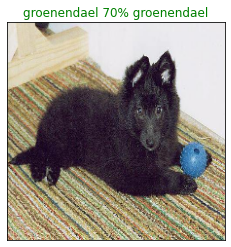

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now we've got one function to visualize our models top prediction, let's make another function to view our top 10 predictions

This function will:
* Take an input of prediction probabilities array and a ground truth array an an integer
* Find the predicted label using `get_pred_label()`
* Find the top 10:
  * Prediction probabilies indexes
  * Prediction probabilities valuess
  * prediction label
* Plot the top 10 prediction probability value and labels, coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 higest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get predicted label
  prob_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  # Change color of true labels
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass


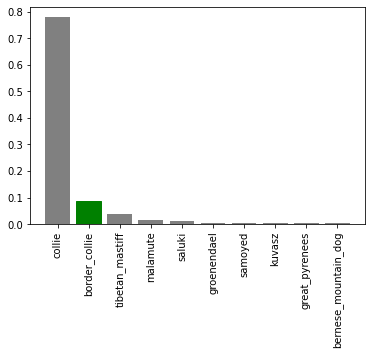

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some functions to help us visualize our predictions and evaluate our model. Let's check out a few

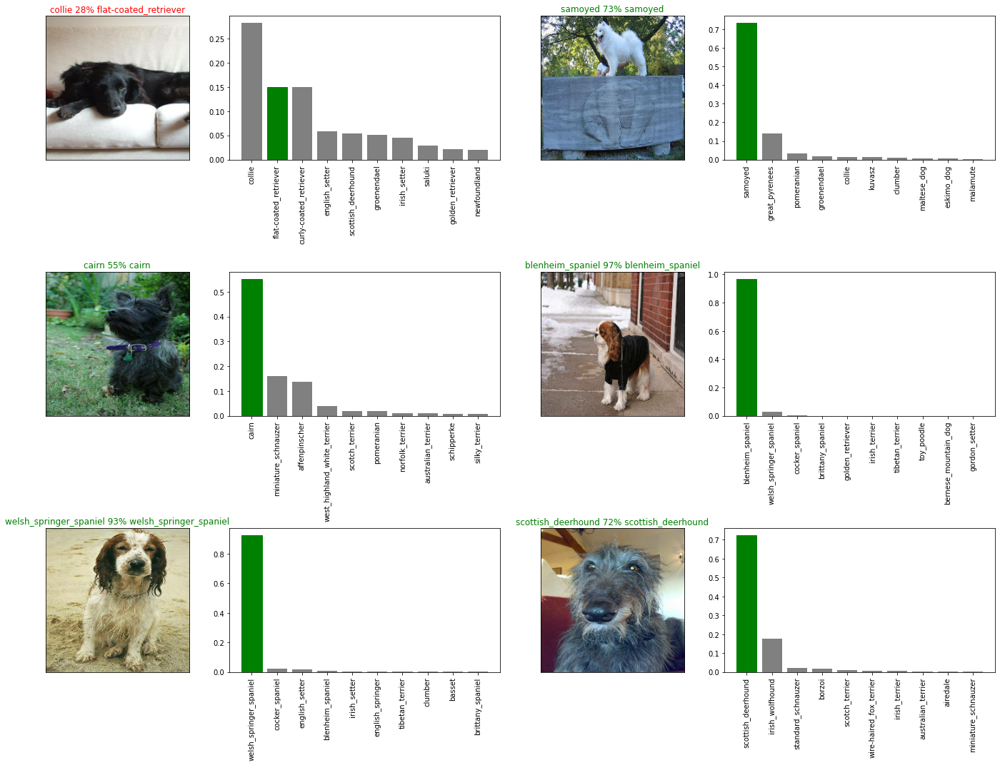

In [ ]:
# Lets check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
  plt.tight_layout(h_pad=1.0)
plt.show()


## Saving and reloading a trained model


In [ ]:
# Create a function  to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a model directory and appends a suffix (string).
  """
  # Create a model directory pathname wit current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir +"_" + suffix +".h5" # the `.h5` is the save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to  load a trained model
def load_model(model_path):
  """
  Loads a saved model rom a speified path.
  """
  print(f"Loading saved model from: {model_path}")
  model=tf.keras.models.load_model(model_path,
                                   custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a model. let' make sure they work.

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20230328-16081680019703_1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20230328-16081680019703_1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model("drive/MyDrive/Dog Vision/models/20230324-22031679695417_1000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/models/20230324-22031679695417_1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 94ms/step - loss: 1.1655 - accuracy: 0.6800


[1.1655223369598389, 0.6800000071525574]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 105ms/step - loss: 1.2245 - accuracy: 0.6700


[1.2245029211044312, 0.6700000166893005]

##Training a big dog model (on full data)

In [ ]:
# Create a data batch with the full dataset
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't moditor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note** Running the cell alone will take a little while (maybe up to 30min for the irst epochs) because the GPU we're using ing the runtime has to load all o the images into memory

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 49s 130ms/step - loss: 1.3452 - accuracy: 0.6673
Epoch 2/100
320/320 [==============================] - 44s 137ms/step - loss: 0.3976 - accuracy: 0.8830
Epoch 3/100
320/320 [==============================] - 36s 113ms/step - loss: 0.2386 - accuracy: 0.9347
Epoch 4/100
320/320 [==============================] - 36s 113ms/step - loss: 0.1535 - accuracy: 0.9633
Epoch 5/100
320/320 [==============================] - 45s 141ms/step - loss: 0.1073 - accuracy: 0.9766
Epoch 6/100
320/320 [==============================] - 45s 139ms/step - loss: 0.0776 - accuracy: 0.9855
Epoch 7/100
320/320 [==============================] - 38s 118ms/step - loss: 0.0597 - accuracy: 0.9918
Epoch 8/100
320/320 [==============================] - 43s 135ms/step - loss: 0.0452 - accuracy: 0.9952
Epoch 9/100
320/320 [==============================] - 50s 157ms/step - loss: 0.0379 - accuracy: 0.9961
Epoch 10/100
320/320 [==============================] - 39s 122m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20230328-16241680020691_full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20230328-16241680020691_full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load in full model
loaded_full_model = load_model("drive/MyDrive/Dog Vision/models/20230328-14301680013841_full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/models/20230328-14301680013841_full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily e created `create_data_batches()` earlier which can take a list of filename as input and convert them into Tensor batches.

To ake prediction on the test data we'll
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_vbatches()` and setting the `test_data` parameter to `True` (Since the test data doesn't have labels.
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/Dog Vision/dog-breed-identification/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/dog-breed-identification/test/06482b717bf262e4da3f029d942c4de6.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/0651dce0bd91b1be37dca4299217b0bc.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/0655d32154c2ea4f2c4715ad0ff00652.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/0656848af0bcfa6437e08a084baa1a48.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/0656e4606d4a98f2e8c8452416ac1ea0.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/0658d98859dbf3976a4a2008097e2dfb.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/06603bac954d5a150ac83836f2bd6c9b.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/065e0b70a690e06a826885b454622928.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/06644044c8bbdb99346813d4836aa7af.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/066546afd3f63a7d3fd90c5a361ff527.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note** Calling `predict()` on our full model and passing it the test data batch will take a long time to run (about an ~1hr)

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 38s 117ms/step


In [ ]:
# Save Predictions (Numpy array) to csv file (for later access)
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv",test_predictions, delimiter=",")

In [ ]:
test_predictions= np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[9.75967964e-14, 5.91187266e-10, 6.23145415e-13, ...,
        2.02644984e-11, 2.36013840e-08, 2.03965733e-11],
       [3.76076309e-10, 5.54726837e-13, 2.02477923e-09, ...,
        4.02312601e-08, 4.94421282e-10, 1.11665373e-11],
       [1.03117542e-10, 4.90985531e-06, 2.54007428e-08, ...,
        4.09711191e-07, 8.04169758e-06, 7.25204963e-09],
       ...,
       [8.00730732e-11, 2.68428699e-11, 1.96761583e-11, ...,
        5.51277886e-08, 1.07740858e-10, 3.25280497e-11],
       [4.75678608e-10, 3.27595160e-08, 3.15244442e-10, ...,
        4.65325201e-08, 1.88292063e-06, 1.47837454e-07],
       [1.76668298e-08, 1.97435757e-08, 2.19977059e-09, ...,
        1.04205187e-08, 4.38130058e-07, 2.27170052e-08]])

In [ ]:
test_predictions.shape

(10357, 120)

## preparing test dataset predictions for Kaggle

Looking at the kaggle sample submission, we fid that it wants our models prediction probability outputsin a dataframe with an ID column and a column or each dog breed. https://www.kaggle.com/competitions/dog-breed-identification/data?select=sample_submission.csv

To get the data in this format, we'll :
* Create a pandas DataFrame with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from the filepaths.
* Add data (the prediction probabilities) to each  of the dog breed columns.
* Export the DataFrame as CSV to submit it to kaggle.

In [ ]:
list(unique_breeds)

['affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenendael',


In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,06482b717bf262e4da3f029d942c4de6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0651dce0bd91b1be37dca4299217b0bc,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0655d32154c2ea4f2c4715ad0ff00652,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0656848af0bcfa6437e08a084baa1a48,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0656e4606d4a98f2e8c8452416ac1ea0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,06482b717bf262e4da3f029d942c4de6,9.759680e-14,5.911873e-10,6.231454e-13,6.361317e-10,1.684947e-11,8.884607e-15,4.666576e-12,1.767895e-11,4.717131e-11,...,1.342202e-10,1.090298e-14,2.030174e-12,9.549318e-11,3.390176e-12,7.212125e-14,6.156231e-11,2.026450e-11,2.360138e-08,2.039657e-11
1,0651dce0bd91b1be37dca4299217b0bc,3.760763e-10,5.547268e-13,2.024779e-09,1.147002e-08,4.822995e-07,9.997007e-01,2.911924e-10,8.819633e-09,5.973794e-11,...,6.747389e-10,1.442434e-09,1.616250e-10,1.970121e-08,5.986081e-10,4.280652e-08,7.264119e-10,4.023126e-08,4.944213e-10,1.116654e-11
2,0655d32154c2ea4f2c4715ad0ff00652,1.031175e-10,4.909855e-06,2.540074e-08,3.871197e-10,6.657569e-10,3.489939e-06,1.243123e-05,1.349684e-05,4.961315e-08,...,4.544560e-08,1.792908e-06,3.724226e-08,2.644578e-07,7.865149e-06,1.348817e-07,1.133632e-12,4.097112e-07,8.041698e-06,7.252050e-09
3,0656848af0bcfa6437e08a084baa1a48,6.748050e-12,5.577339e-11,7.317248e-11,2.126612e-10,4.335190e-05,5.177792e-05,2.670913e-06,7.964686e-02,2.054888e-09,...,1.667618e-07,1.975346e-08,1.376350e-07,1.592782e-08,1.038742e-06,3.104326e-08,3.383098e-11,6.027949e-01,7.958535e-08,4.333253e-10
4,0656e4606d4a98f2e8c8452416ac1ea0,1.201947e-08,3.135485e-07,3.075046e-08,3.463985e-02,1.129885e-08,5.473133e-06,3.930881e-02,1.206535e-07,1.310218e-08,...,1.469024e-11,1.203985e-06,2.664902e-05,4.341759e-07,3.367395e-09,9.001513e-10,1.022752e-08,3.928554e-05,4.940371e-07,7.724759e-03


In [ ]:
# Export answer to CSV for submission to kaggle 
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

## Making predictions on custom images

To make predictions on custom images, we'll:
* Get filepath of our own images.
*Turn the filepaths into data batches usibng `create_data_batches()`. And since our custom images woun't have labels we set the test parameter to `True`.
* Pass the custom image data to our model's `predict()` method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.
 

In [ ]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog Vision/custom-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/Dog Vision/custom-dog-photos/dog7.jpg',
 'drive/MyDrive/Dog Vision/custom-dog-photos/dog5.jpg',
 'drive/MyDrive/Dog Vision/custom-dog-photos/dog6.jpg',
 'drive/MyDrive/Dog Vision/custom-dog-photos/dog4.jpg',
 'drive/MyDrive/Dog Vision/custom-dog-photos/dog3.jpg',
 'drive/MyDrive/Dog Vision/custom-dog-photos/dog2.jpg',
 'drive/MyDrive/Dog Vision/custom-dog-photos/dog1.jpg']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on te custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [ ]:
custom_preds.shape

(7, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['cardigan',
 'sussex_spaniel',
 'siberian_husky',
 'rottweiler',
 'labrador_retriever',
 'pomeranian',
 'samoyed']

In [ ]:
# Get custom image  (our unbatchiy() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatch data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

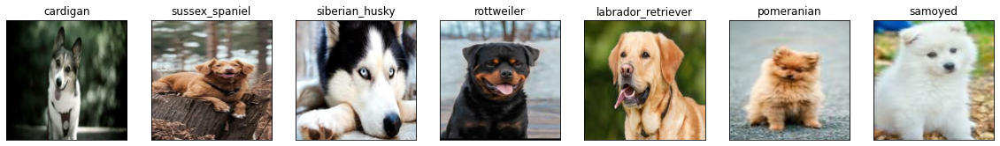

In [ ]:
# Check custom image predictions
plt.figure(figsize=(20, 20))
for i, image in enumerate(custom_images):
  plt.subplot(1, 7, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)